## Gaussian State Space Model - An exploration into the effectiveness of Kalman Filtration for location detection

### Introduction of Linear Gaussian State Space Model

Linear Gaussian State Space Models are any models of the form:

$X_t = F_tX_t + G_tV_t, t = 1, ..., T$

$Y_t = H_tX_t + W_t, t = 1, ..., T$

Where $X_0, V_1, ..., V_T, W_1, W_2, ..., W_T$ are independent with $X_0 \sim N(\mu_0, \Sigma_0), V_t \sim N(0, Q_t), W_t \sim N(0, R_t)$:

- $X_t$ is the hidden state at time t
- $Y_t$ is the observed state at time t
- $V_t$ is the state noise at time t
- $W_t$ is the observation noise at time t
- $F_t$ is the $d_x \times d_x$ state transition matrix at time t
- $G_t$ is the $d_x \times d_v$ noise transfer matrix at time t
- $H_t$ is the $d_y \times d_x$ observation matrix at time t

Thus we have $p(x_{0:t},y_{1:T}) = p(x_0)\sum\limits_{t=1}^{T}{p(y_t|x_t)p(x_t|x_{t-1})}$, where:

- $p(x_t|x_{t-1}) \sim N(F_tx_{t-1}, G_tQ_tG_t')$
- $p(y_t|x_t) \sim N(H_tx_t, R_t)$

### Kalman Filtration

Define:

- $\mu_{t|t-1} := \mathbb{E}[X_t|Y_{1:t-1} = y_{1:t-1}]$
- $\Sigma_{t|t-1} := \mathbb{E}[(X_t - \mu_{t|t-1})(X_t - \mu_{t|t-1})'|Y_{1:t-1} = y_{1:t-1}]$
- $\mu_{t|t} := \mathbb{E}[X_t|Y_{1:t} = y_{1:t}]$
- $\Sigma_{t|t} := \mathbb{E}[(X_t - \mu_{t|t})(X_t - \mu_{t|t})'|Y_{1:t} = y_{1:t}]$

So that $p(x_t|y_{1:t-1}) \sim N(\mu_{t|t-1}, \Sigma_{t|t-1}), p(x_t|y_{1:t}) \sim N(\mu_{t|t}, \Sigma_{t|t})$. It can be shown that:

- $\mu_{t|t-1} = F_t\mu_{t-1|t-1}$
- $\Sigma_{t|t-1} = F_t\Sigma_{t-1|t-1}F_t' + G_tQ_tG_t'$
- $\mu_{t|t} = \mu_{t|t-1} + K_t\nu_t$
- $\Sigma_{t|t} = (I - K_tH_t)\Sigma_{t|t-1}$

Where:
- $\nu_t = y_t - H_t\mu_{t|t-1}$
- $K_t = \Sigma_{t|t-1}H_t'S_t^{-1}$
- $S_t = H_t\Sigma_{t|t-1}H_t' + R_t$

### Kalman Smoother

Define:

- $\mu_{t|T} := \mathbb{E}[X_t|Y_{1:T} = y_{1:T}]$
- $\Sigma_{t|T} := \mathbb{E}[(X_t - \mu_{t|T})(X_t - \mu_{t|T})'|Y_{1:T} = y_{1:T}]$

So that $p(x_t|y_{1:T}) \sim N(\mu_{t|T}, \Sigma_{t|T})$. It can be shown that:

- $\mu_{t|T} = \mu_{t|t} + J_t(\mu_{t+1|T} - \mu_{t+1|t})$
- $\Sigma_{t|T} = \Sigma_{t|t} + J_t(\Sigma_{t+1|T} - \Sigma_{t+1|t})J_t'$

Where $J_t = \Sigma_{t|t}F_{t+1}'\Sigma_{t+1|t}^{-1}$

### Model Specification

Let $X_t = (P_t^x, P_t^y, V_t^x, V_t^y)$ denote the position and velocity of an object at time t. We observe a noisy GPS observation, $Y_t = (P_t^x, P_t^y) + W_t$, where $W_t \sim N(0, R)$ are independent. We also approximate the dynamics of the particle as:

$P_t = P_{t-1} + \delta{V_{t-1}} + \dfrac{\delta^2}{2}{A_{t}}$

$V_t = (1 - d)V_{t-1} + \delta{A_{t}}$

Where $A_t \sim N(0, Q_t)$ are the unknown acceleration at time t, and $d$ is a coefficient that controls the drag of the particle.


So we notice that $X_t$ can be modelled by a Linear Gaussian State Space model, with:

$F_t = \left(\begin{array}{cc} 
I_2 & \delta{I_2}\\
0 & (1 - d)I_2
\end{array}\right),
G_t = \left(\begin{array}{cc} 
\dfrac{\delta^2}{2}I_2\\
\delta{I_2}\\
\end{array}\right),
H_t = \left(\begin{array}{cc} 
I_2\\
0\\
\end{array}\right)$

In our model we set:

$\mu_0 = 0,
\Sigma_0 = I_4,
R_t = \sigma_y^2I_2,
W_t = \sigma_a^2I_2$,

$\sigma_y = 25, \sigma_a = 2, d = 0.01\delta, \delta = 0.25$

In [1]:
%matplotlib inline
import numpy as np
from scipy.stats import chi2
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from matplotlib.patches import Ellipse
from IPython.display import HTML
from numba import njit

# replace with your preferred animation writer
plt.rcParams['animation.writer'] = 'avconv'
plt.rcParams['animation.avconv_path'] = '/usr/local/bin/avconv'

In [2]:
@njit
def kalman(y, F, G, Q, H, R, mu0, Sigma0):
    dy = y.shape[1]
    T = y.shape[0]
    dx = len(mu0)
    I = np.eye(dx)
    
    # transposes arrays
    Ft = np.ascontiguousarray(F.transpose())
    Gt = np.ascontiguousarray(G.transpose())
    Ht = np.ascontiguousarray(H.transpose())
    
    # initialisation
    mu_p = np.zeros((T, dx))
    Sigma_p = np.zeros((T, dx, dx))
    mu_f = np.zeros((T, dx))
    Sigma_f = np.zeros((T, dx, dx))
    mu_s = np.zeros((T, dx))
    Sigma_s = np.zeros((T, dx, dx))
    
    # forward recursion
    mu_p[0,:] = F @ mu0
    Sigma_p[0,:,:] = F @ Sigma0 @ Ft + G @ Q @ Gt
    
    # update
    nu = y[0,:] - H @ mu_p[0,:]
    S = H @ Sigma_p[0] @ Ht + R
    K = Sigma_p[0] @ Ht @ np.linalg.pinv(S)
    mu_f[0,:] = mu_p[0,:] + K @ nu
    Sigma_f[0,:,:] = (I - K @ H) @ Sigma_p[0]
    
    for t in range(1, T):
        # prediction
        mu_p[t,:] = F @ mu_f[t-1,:]
        Sigma_p[t,:,:] = F @ Sigma_f[t-1] @ Ft + G @ Q @ Gt

        # update
        nu = y[t,:] - H @ mu_p[t,:]
        S = H @ Sigma_p[t] @ Ht + R
        K = Sigma_p[t] @ Ht @ np.linalg.pinv(S)
        mu_f[t,:] = mu_p[t,:] + K @ nu
        Sigma_f[t,:,:] = (I - K @ H) @ Sigma_p[t]
    
    # backward recursion
    mu_s[T-1,:] = mu_f[T-1,:]
    Sigma_s[T-1,:,:] = Sigma_f[T-1,:,:]
    
    for t in range(T-2, -1, -1):
        J = Sigma_f[t] @ Ft @ np.linalg.pinv(Sigma_p[t+1,:,:])
        mu_s[t,:] = mu_f[t,:] + J @ (mu_s[t+1,:] - mu_p[t+1,:])
        Sigma_s[t,:,:] = Sigma_f[t,:,:] + J @ (Sigma_s[t+1,:,:] - Sigma_p[t+1,:,:]) @ J.transpose()
        
    return mu_p,Sigma_p,mu_f,Sigma_f,mu_s,Sigma_s

In [3]:
# generates linear gaussian state space model with specified covariance and transfer matrices
def gaussian_state_space_model(T, F, G, Q, H, R, mu0, Sigma0):
    d_x = Sigma0.shape[0]
    d_v = Q.shape[0]
    d_y = R.shape[0]
    X = np.zeros(shape=(1 + T, d_x))
    Y = np.zeros(shape=(T, d_y))

    X[0] = np.random.normal(size=(d_x)) @ np.linalg.cholesky(Sigma0).transpose() + mu0
    V = np.random.normal(size=(T, d_v)) @ np.linalg.cholesky(Q).transpose()
    W = np.random.normal(size=(T, d_y)) @ np.linalg.cholesky(R).transpose()

    for t in range(T):
        X[t+1] = F @ X[t] + G @ V[t]
        Y[t] = H @ X[t+1] + W[t]
        
    return X, Y

In [4]:
# defines covariance and transfer matrices for the Gaussian State Space Model
dt = 0.25
sigma_y = 25
sigma_a = 2
drag = 0.01 * dt

F = np.zeros((4, 4))
F[0, 0] = 1
F[1, 1] = 1
F[0, 2] = dt
F[1, 3] = dt
F[2, 2] = 1 - drag
F[3, 3] = 1 - drag

G = np.zeros((4,2))
G[0, 0] = dt ** 2 / 2
G[1, 1] = dt ** 2 / 2
G[2, 0] = dt
G[3, 1] = dt

Q = np.eye(2) * sigma_a ** 2

H = np.zeros((2,4))
H[0,0] = 1
H[1,1] = 1

R = np.eye(2) * sigma_y ** 2

mu0 = np.zeros(4)
Sigma0 = np.diag([1.,1.,1.,1.])

In [5]:
T = 10000
X, Y = gaussian_state_space_model(T, F, G, Q, H, R, mu0, Sigma0)

res = kalman(Y, F, G, Q, H, R, mu0, Sigma0)
mu_f = res[2]
sigma_f = res[3]
distsq_before = ((X[1:, 0:2] - Y) ** 2).sum(axis=1)
distsq_after = ((X[1:, 0:2] - mu_f[:,0:2]) ** 2).sum(axis=1)

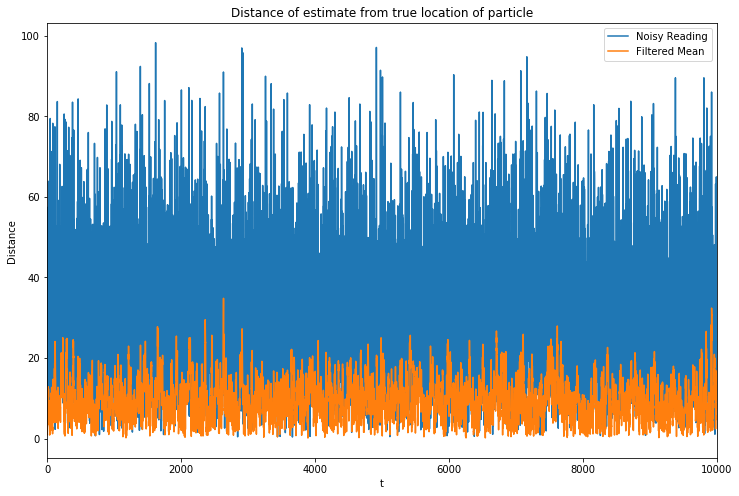

In [6]:
plt.figure(figsize=(12,8))
plt.plot(np.sqrt(distsq_before))
plt.plot(np.sqrt(distsq_after))
plt.xlabel('t')
plt.ylabel('Distance')
plt.title('Distance of estimate from true location of particle')
plt.xlim([0, T])
plt.legend(['Noisy Reading', 'Filtered Mean'])
plt.show()

In [7]:
print("Quadratic Loss of Noisy Reading: {:.3f}".format(distsq_before.sum()))
print("Quadratic Loss of Filtered Mean: {:.3f}".format(distsq_after.sum()))
print("Percentage Reduction in Quadratic Loss: {:.2f}%".format(
    100 * (1 - distsq_after.sum()/distsq_before.sum())))

Quadratic Loss of Noisy Reading: 12500962.000
Quadratic Loss of Filtered Mean: 1165260.197
Percentage Reduction in Quadratic Loss: 90.68%


In [8]:
def path_scatter(locs, *args, **kwargs):
    x = locs[:,0]
    y = locs[:,1]    
    plt.scatter(x, y, *args, **kwargs)
    
def path_line(locs, *args, **kwargs):
    x = locs[:,0]
    y = locs[:,1]    
    plt.plot(x, y, *args, **kwargs)
    
def path_arrow_line(locs, arrow_head_size=np.sqrt(T)/10, *args, **kwargs):
    x = locs[:,0]
    y = locs[:,1]    
    for t in range(1, len(x)):
        if t == len(x) - 1:
            kwargs['head_width'] = arrow_head_size
            kwargs['head_length'] = arrow_head_size
            kwargs['facecolor'] = 'black'
        plt.arrow(x[t-1], y[t-1], x[t]-x[t-1], y[t]-y[t-1],
                  length_includes_head = True, *args, **kwargs)
        
def mahalanobis_dist(x, covar):
    return np.sqrt(x @ np.linalg.pinv(covar) @ x)

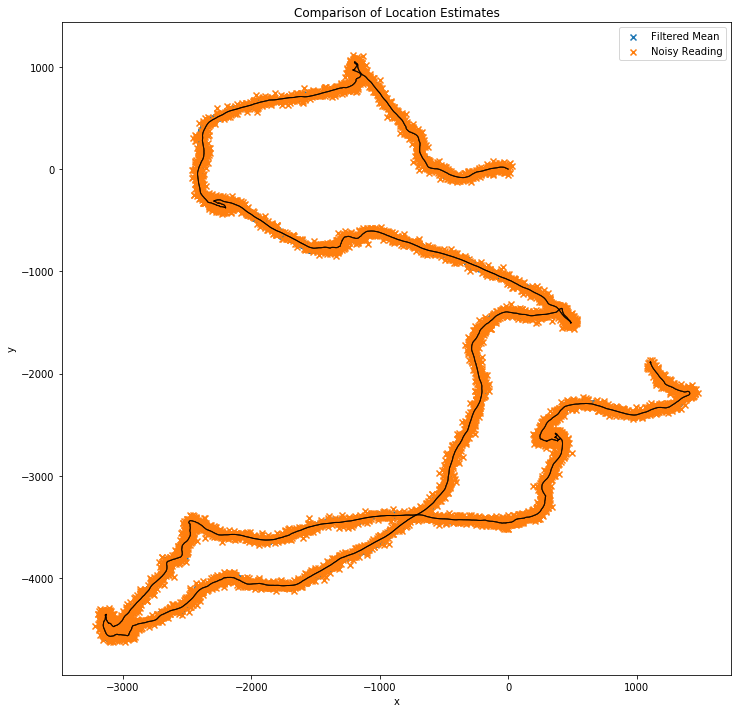

In [9]:
plt.figure(figsize=(12,12))
path_arrow_line(X[:, 0:2])
path_scatter(mu_f[:, 0:2], marker = 'x')
path_scatter(Y[:, 0:2], marker = 'x')
plt.xlabel('x')
plt.ylabel('y')
plt.legend(['Filtered Mean', 'Noisy Reading'])
plt.title('Comparison of Location Estimates')
plt.show()

In [10]:
p_value = 0.01
slide_range = 10
width = 200

# sets up plot
fig = plt.figure(figsize=(10,10))
ax = plt.axes(xlim = (-200, 200), ylim=(-200, 200))
particle = ax.scatter([X[0, 0]], [X[0, 1]], marker='o', color='black')
readings = ax.scatter([Y[0, 0]], [Y[0, 1]], marker='x', color='red')
filtered_mean = ax.scatter([mu_f[0, 0]], [mu_f[0, 1]], marker='x', color='green')

z = np.sqrt(chi2.ppf(1 - p_value, df=2))
conf_int = Ellipse(mu_f[0, 0:2], 2 * z * np.sqrt(sigma_f[0,0,0]) , 2 * z * np.sqrt(sigma_f[0,1,1]), 0)
conf_int.set_alpha(0.1)
ax.add_artist(conf_int)
path, = ax.plot([],[], color='black')

plt.title("Location Estimation by Kalman Filtered Mean (with {:.2f} confidence interval)".format(1-p_value))
plt.legend(["Particle Path", "Particle", "Readings", "Filtered Mean"], loc = "upper right")
plt.xlabel("x")
plt.ylabel("y")

# initialization function: plot the background of each frame
def init():
    return animate(0)

# animation function. This is called sequentially
def animate(i):
    x, y = X[i:(i+slide_range),0:2].mean(axis=0)
    xlim = [x - width/2, x + width/2]
    ylim = [y - width/2, y + width/2]
    
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)
    
    path.set_xdata(X[0:(i+2), 0])
    path.set_ydata(X[0:(i+2), 1])
    
    particle.set_offsets(np.array([X[i+1, 0:2]]))
    readings.set_offsets(Y[0:i])
    filtered_mean.set_offsets(mu_f[i, 0:2])
    conf_int.set_center(mu_f[i, 0:2])
    
    covar = sigma_f[i,0:2,0:2]
    D, Q = np.linalg.eig(covar)
    conf_int.width = 2 * z * np.sqrt(D[0])
    conf_int.height = 2 * z * np.sqrt(D[1])
    conf_int.angle = np.arctan2(Q[1,0], Q[0,0]) * 180 / np.pi
    
    # if X ~ N(mu, covar), (X - mu)covar^-1(X-mu) ~ chisq(dim(mu))
    if mahalanobis_dist(X[i+1, 0:2] - mu_f[i, 0:2], covar) > z:
        conf_int.set_color('red')
        filtered_mean.set_color('red')
    else:
        conf_int.set_color('green')
        filtered_mean.set_color('green')
    return [particle]

# compliles animation
anim = animation.FuncAnimation(fig, animate, init_func=init, frames=T, interval=20, blit=True)
plt.close();

In [11]:
# renders video for location estimation
HTML(anim.to_html5_video())